In [1]:
from JupyterImport import *
root_logger.setLevel(logging.WARNING)
import plotly.express as px
from plotly.subplots import make_subplots
from plotly.offline import iplot
from src.Scripts.Aug17_TransitionVsBias import get_transition_vs_bias_repeats

## Checking Sweeprate vs Transition shape

In [58]:
# dats = get_dats(range(465, 469+1), dattypes={'transition'})
dats = get_dats(range(477, 482+1), dattypes={'transition'})

for dat in dats:
    print(f'Dat{dat.datnum}: {dat.Logs.comments}')

Dat477: Starting scan at Sweeprate = 1000.0mV/s (LP*200), Sweeprate (real) = 5.0mV/s, repeats=15
Dat478: Starting scan at Sweeprate = 5000.0mV/s (LP*200), Sweeprate (real) = 25.0mV/s, repeats=75
Dat479: Starting scan at Sweeprate = 10000.0mV/s (LP*200), Sweeprate (real) = 50.0mV/s, repeats=150
Dat480: Starting scan at Sweeprate = 15000.0mV/s (LP*200), Sweeprate (real) = 75.0mV/s, repeats=225
Dat481: Starting scan at Sweeprate = 20000.0mV/s (LP*200), Sweeprate (real) = 100.0mV/s, repeats=300
Dat482: Starting scan at Sweeprate = 25000.0mV/s (LP*200), Sweeprate (real) = 125.0mV/s, repeats=375


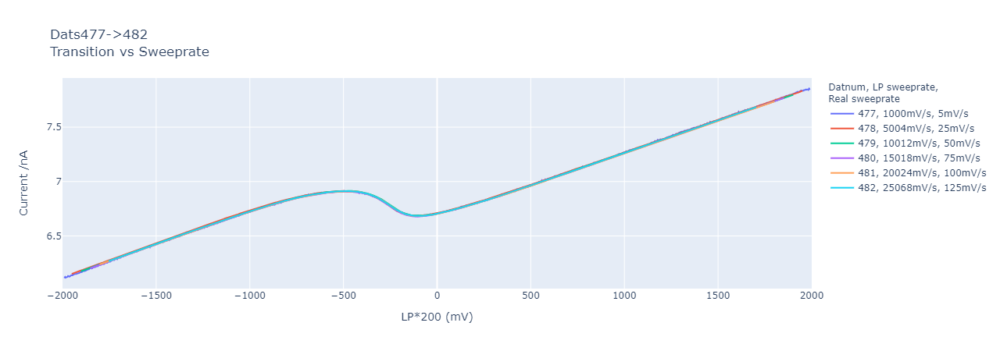

In [59]:
xs = [dat.Data.x_array for dat in dats]
avg_transitions = [dat.Transition.avg_data for dat in dats]

filter = True
if filter is True:
    avg_transitions = [CU.decimate(data, dat.Logs.Fastdac.measure_freq, 500) for data, dat in zip(avg_transitions, dats)]
    xs = [np.linspace(x[0], x[-1], data.shape[-1]) for x, data in zip(xs, avg_transitions)]

fig = go.Figure()
PlU.fig_setup(fig, f'Dats{dats[0].datnum}->{dats[-1].datnum}<br>Transition vs Sweeprate', f'{dat.Logs.x_label}', 'Current /nA', 'Datnum, LP sweeprate,<br>Real sweeprate')

for dat, x, data in zip(dats, xs, avg_transitions):
    fig.add_trace(go.Scatter(mode='lines', x=x, y=data, name=f'{dat.datnum}, {dat.Logs.sweeprate:.0f}mV/s, {dat.Logs.sweeprate/200:.0f}mV/s'))
# fig.write_html('Exports/sweeprate.html')
fig.show()

So all the data looks the same at least, now lets check fit values and variability

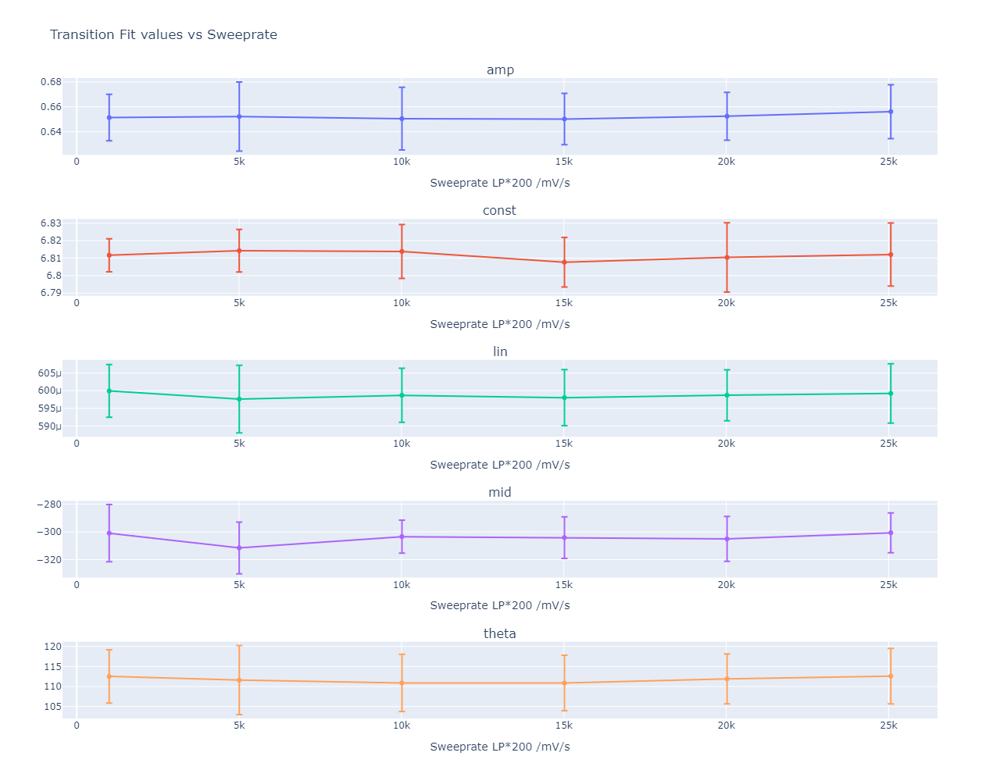

In [4]:
keys = dat.Transition.avg_fit.best_values.keys
fig = make_subplots(rows=5, cols=1, subplot_titles=keys, vertical_spacing=0.1)
for i, key in enumerate(keys):
    xs = [dat.Logs.sweeprate for dat in dats]
    values = [getattr(dat.Transition.avg_fit.best_values, key) for dat in dats]
    errors = [np.std([getattr(f.best_values, key) for f in dat.Transition.all_fits]) for dat in dats]
    fig.add_trace(go.Scatter(x=xs, y=values, error_y=dict(type='data', array=errors, visible=True)), row=i+1, col=1)
fig.update_layout(height=1000, showlegend=False, title_text='Transition Fit values vs Sweeprate')
fig.update_xaxes(title='Sweeprate LP*200 /mV/s')
fig

## Transition vs HQPC bias with all center ohmics connected now

In [6]:
dats = get_dats(range(470, 476+1))
for dat in dats:
    print(f'dat{dat.datnum}: {dat.Logs.comments}')

dat470: transition, R2T(10M)=1000.0mV, TC/0.001=0mV, repeat measurements with various DCbias to check transition shape
dat471: transition, R2T(10M)=500.0mV, TC/0.001=0mV, repeat measurements with various DCbias to check transition shape
dat472: transition, R2T(10M)=250.0mV, TC/0.001=0mV, repeat measurements with various DCbias to check transition shape
dat473: transition, R2T(10M)=0.0mV, TC/0.001=0mV, repeat measurements with various DCbias to check transition shape
dat474: transition, R2T(10M)=-250.0mV, TC/0.001=-0mV, repeat measurements with various DCbias to check transition shape
dat475: transition, R2T(10M)=-500.0mV, TC/0.001=-0mV, repeat measurements with various DCbias to check transition shape
dat476: transition, R2T(10M)=-1000.0mV, TC/0.001=-0mV, repeat measurements with various DCbias to check transition shape


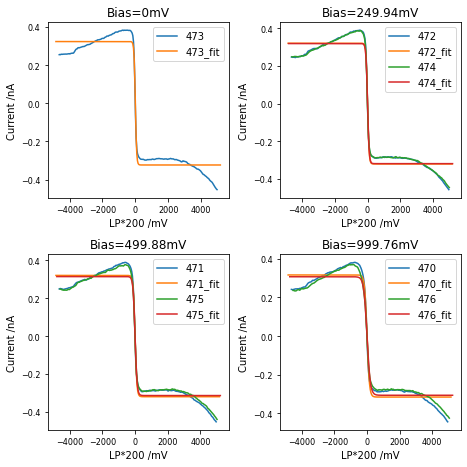

In [7]:
%matplotlib inline
tbr = get_transition_vs_bias_repeats(dats)
fig = plt.gcf()
plt.tight_layout()

## New DC bias scans (not 2D sweep not repeats) with all ohmics in center channel connected

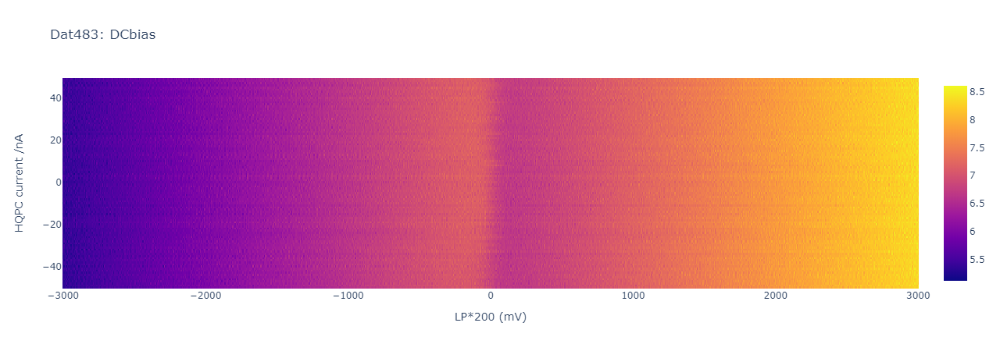

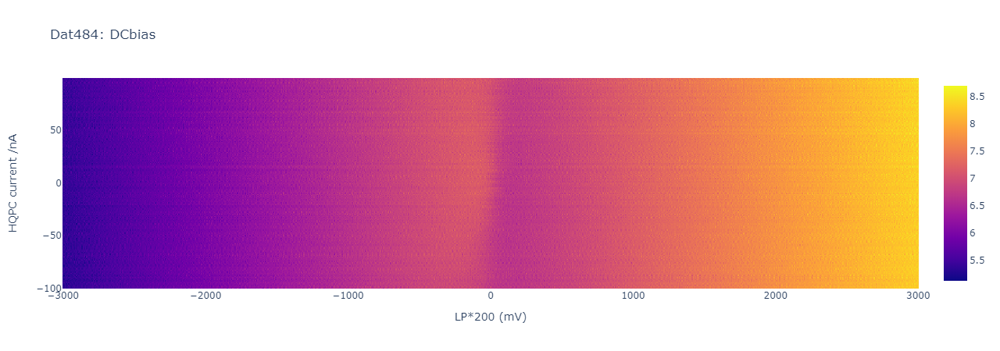

In [61]:
dats = get_dats([483, 484])
figs = [go.Figure() for dat in dats]
for dat, fig in zip(dats,figs):
    data = dat.Data.i_sense
    x = dat.Data.x_array
    y = dat.Data.y_array[:]/10
    
    y, data = y[::20], data[::20, :]
    
    fig.add_trace(go.Heatmap(x=x, y=y, z=data))
    PlU.fig_setup(fig, f'Dat{dat.datnum}: DCbias', f'{dat.Logs.x_label}', 'HQPC current /nA')
fig.update_layout()
    
for fig in figs:
    fig.show()

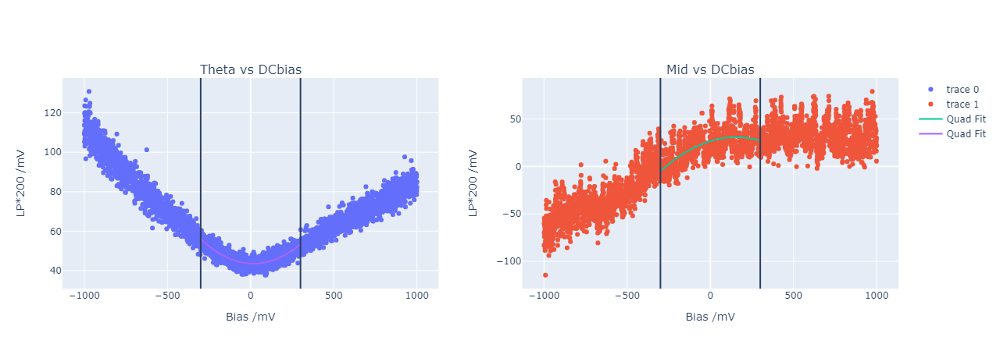

In [62]:
dat = get_dat(484)
thetas = np.array([fit.best_values.theta for fit in dat.Transition.all_fits]).astype(np.float32)
mids = np.array([fit.best_values.mid for fit in dat.Transition.all_fits]).astype(np.float32)
x = dat.Data.y_array[:]

fig = make_subplots(rows=1, cols=2, subplot_titles=['Theta vs DCbias', 'Mid vs DCbias'])
for col, data, name in zip([1,2], [thetas, mids], ['theta', 'mid']):
    fig.add_trace(go.Scatter(mode='markers', x=x, y=data), row=1, col=col)
fig.update_xaxes(title='Bias /mV')
fig.update_yaxes(title='LP*200 /mV');


quad_model = lm.models.QuadraticModel()
line_model = lm.models.LinearModel()

between = [-300, 300]
ids = CU.get_data_index(dat.Data.y_array[:], between)

pars = quad_model.make_params()
pars['a'].value = 0
pars['b'].value = 0.02
pars['c'].value = 25

fit_data = np.array(mids[ids[0]:ids[1]]).astype(np.float32)
x = dat.Data.y_array[ids[0]:ids[1]].astype(np.float32)
fit = quad_model.fit(fit_data, x = x, params=pars, nan_policy='omit')
line_fit = line_model.fit(fit_data, x=x, nan_policy='omit')


for ax in ['x1', 'x2']:
    for val in between:
        fig.add_shape(dict(type='line', yref='paper', y0=0, y1=1, xref=ax, x0=val, x1=val))    

temp_x = np.linspace(between[0], between[1], 100)
fig.add_trace(go.Scatter(mode='lines', x=temp_x, y=fit.eval(x=temp_x), name='Quad Fit'), row=1, col=2)


theta_quad = lm.models.QuadraticModel()
theta_pars = theta_quad.make_params()
theta_pars['c'].value = 50

theta_data = np.array(thetas[ids[0]:ids[1]]).astype(np.float32)
theta_fit = theta_quad.fit(theta_data, x=x, nan_policy='omit', params=theta_pars)

fig.add_trace(go.Scatter(mode='lines', x=temp_x, y=theta_fit.eval(x=temp_x), name='Quad Fit'), row=1, col=1);
# fig.write_html('Exports/dat484DCbias.html')
fig.show()

In [55]:
print(fit.fit_report(), '\n\n')
print(line_fit.fit_report(), '\n\n')
print('Theta fit:\n', theta_fit.fit_report())

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 9
    # data points      = 1198
    # variables        = 3
    chi-square         = 184045.31
    reduced chi-square = 154.012814
    Akaike info crit   = 6037.36513
    Bayesian info crit = 6052.63036
[[Variables]]
    a: -1.7273e-04 +/- 1.3372e-05 (7.74%) (init = 0)
    b:  0.05355534 +/- 0.00207179 (3.87%) (init = 0.02)
    c:  26.7333460 +/- 0.53764169 (2.01%) (init = 25)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, c) = -0.745 


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 10
    # data points      = 1198
    # variables        = 2
    chi-square         = 209730.83
    reduced chi-square = 175.360224
    Akaike info crit   = 6191.87538
    Bayesian info crit = 6202.05220
[[Variables]]
    slope:      0.05362216 +/- 0.00221074 (4.12%) (init = 1)
    intercept:  21.5601204 +/- 0.38257413 (1.77%) (

In [41]:
x = np.linspace(-30, 30, 1000)
temp = theta_fit.eval(x=x)


981

## This is the comparison between DCbias with all ohmics connected and ohmics floating

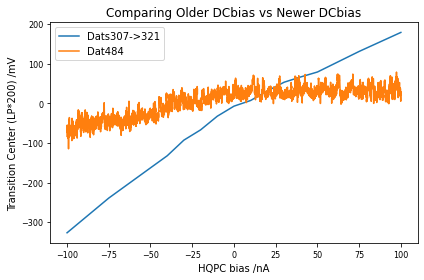

In [42]:
dats = get_dats(range(307, 321+1))

hqpcs = [dat.Logs.fds['R2T(10M)']/10 for dat in dats]
centers = [dat.Transition.avg_fit.best_values.mid for dat in dats]

ndat = get_dat(484)
nhqpcs = ndat.Data.y_array[:]/10
ncenters = [fit.best_values.mid for fit in ndat.Transition.all_fits]

%matplotlib qt
fig, ax = plt.subplots(1,1)

ax.plot(hqpcs, centers, label=f'Dats{dats[0].datnum}->{dats[-1].datnum}')
ax.plot(nhqpcs, ncenters, label=f'Dat{ndat.datnum}')

P.ax_setup(ax, f'Comparing Older DCbias vs Newer DCbias', 'HQPC bias /nA', 'Transition Center (LP*200) /mV', legend=True)

plt.tight_layout();